In [ ]:
!pip install torch

In [1]:
import torch # why does this not error when it's not installed???
import torch.nn as nn
from torch.nn.modules.container import Sequential
from torch.serialization import add_safe_globals

In [3]:
# cached bytecode: python precompiles .py files into .pyc files. You must delete these after editing.
!find ~/fun/jane_street_puzzles/dwarkesh/.venv/ -name "*.pyc" -delete
!find ~/fun/jane_street_puzzles/dwarkesh/.venv/ -name "*.pyc" 

In [4]:
!python --version

Python 3.9.21


In [5]:
!which python

/Users/tubi/fun/jane_street_puzzles/dwarkesh/.venv/bin/python


In [6]:
# import torch
print(torch.__version__)
print(torch.version.git_version)

2.6.0
2236df1770800ffea5697b11b0bb0d910b2e59e1


In [ ]:
!pip install cloudpickle

import cloudpickle

In [74]:
def print_weights(weights):
  for i, row in enumerate(weights):
    print(f"row {i}", row)

In [7]:
model_file_path = "model.pt"
model_data = torch.load(model_file_path, map_location=torch.device("cpu"), weights_only=False)

#check if it's a full model or just state_dict
if isinstance(model_data, torch.nn.Module):
  model = model_data
  model.eval()
  print("Loaded entire model. Architecture:")
  print(model)
else:
  # assume it's a state_dict (weights only)
  state_dict = model_data
  print("State dict keys:")
  print(state_dict.keys())



Loaded entire model. Architecture:
Sequential(
  (0): Linear(in_features=55, out_features=224, bias=True)
  (1): ReLU()
  (2): Linear(in_features=224, out_features=232, bias=True)
  (3): ReLU()
  (4): Linear(in_features=232, out_features=64, bias=True)
  (5): ReLU()
  (6): Linear(in_features=64, out_features=208, bias=True)
  (7): ReLU()
  (8): Linear(in_features=208, out_features=200, bias=True)
  (9): ReLU()
  (10): Linear(in_features=200, out_features=212, bias=True)
  (11): ReLU()
  (12): Linear(in_features=212, out_features=204, bias=True)
  (13): ReLU()
  (14): Linear(in_features=204, out_features=216, bias=True)
  (15): ReLU()
  (16): Linear(in_features=216, out_features=208, bias=True)
  (17): ReLU()
  (18): Linear(in_features=208, out_features=220, bias=True)
  (19): ReLU()
  (20): Linear(in_features=220, out_features=212, bias=True)
  (21): ReLU()
  (22): Linear(in_features=212, out_features=224, bias=True)
  (23): ReLU()
  (24): Linear(in_features=224, out_features=216, bias

In [25]:
for i, layer in enumerate(model.children()):
  # print(f"layer {i} is {layer}")

  is_linear = isinstance(layer, nn.Linear)
  print(f"{i}, {is_linear}")
  if is_linear:
    shape = layer.weight.shape
    if shape[0] == shape[1]:
      print(f"shape is {layer.weight.shape}, bias is = {all(v == 0 for v in layer.bias)}")
      print(f"weights {layer.weight}")
      print(f"biases shape {layer.bias.shape} {layer.bias}")
      #is_weights_identity = (torch.eye(shape[0]) == layer.weight).all().item()
      all_equal = torch.eye(shape[0]) == layer.weight
      is_weights_identity = torch.equal(torch.eye(shape[0], dtype=torch.float32), layer.weight) # these two ^^ are equivalent
      #is_weights_identity = torch.eye(shape[0]) == layer.weight
      print(f"weights is identity = {all_equal}")
      #print(f"weights dtypt = {layer.weight.dtype}")
      # for row in layer.weight:
      #   print(row)
      for i, row in enumerate(all_equal):
        all_good = True
        for j, column in enumerate(row):
          if column == False:
            all_good = False
            print(f"these are not equal {i, j}")
        if not all_good:
          print(f"row = {layer.weight[i]}")


0, True
1, False
2, True
3, False
4, True
5, False
6, True
7, False
8, True
9, False
10, True
11, False
12, True
13, False
14, True
15, False
16, True
17, False
18, True
19, False
20, True
21, False
22, True
23, False
24, True
25, False
26, True
27, False
28, True
29, False
30, True
31, False
32, True
33, False
34, True
35, False
36, True
37, False
38, True
39, False
40, True
41, False
42, True
43, False
44, True
45, False
46, True
47, False
48, True
49, False
50, True
51, False
52, True
53, False
54, True
55, False
56, True
57, False
58, True
59, False
60, True
61, False
62, True
63, False
64, True
65, False
66, True
shape is torch.Size([288, 288]), bias is = False
weights Parameter containing:
tensor([[1., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 1.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 1., 0., 0.],
        [0., 0., 0.,  ..., 0., 1., 0.],
        [0., 0., 0.,  ..., 0., 0., 1.]], requires_grad=True)
biases shape torch.Si

In [ ]:
"""
linear equation is output = X @ W + b ! is this even correct??? is X first or W???

torch docs says y = xA.T + b
so we all agree on `+b` but what's `x` and what's `A`

NOTE: we need to understand in_features and out_features in the Linear layer


relu = 0 for x < 0 and x for x >= 0


first layer is a Linear layer: Linear(in_features=55, out_features=224, bias=True)
which means it accepts a vector of (1, 55)
so X = (1, 55)
so L1 = (55, 224)
which then would produce (1, 224) as the output of the linear equation
"""

In [63]:
x = model[:1] # I think this means get the first layer??? by did he call it x
x # ok yes this is the first layer

Sequential(
  (0): Linear(in_features=55, out_features=224, bias=True)
)

In [61]:
input_layer_1 = [5441 - x for x in range(55)]
# print(f"input_layer_1={input_layer_1}")
# input_to_ascii = [ascii(chr(v)) for v in input_layer_1]
# input_to_ascii

In [64]:
#y = x(torch.Tensor([1, 2, 3, 4, 5] + [0] * 50)) # this is the output of firs layer, let's print it
y = x(torch.Tensor(input_layer_1))
y

tensor([ 5.4410e+03,  5.4400e+03,  5.4390e+03,  5.4380e+03,  5.4370e+03,
         5.4360e+03,  5.4350e+03,  5.4340e+03,  5.4330e+03,  5.4320e+03,
         5.4310e+03,  5.4300e+03,  5.4290e+03,  5.4280e+03,  5.4270e+03,
         5.4260e+03,  5.4250e+03,  5.4240e+03,  5.4230e+03,  5.4220e+03,
         5.4210e+03,  5.4200e+03,  5.4190e+03,  5.4180e+03,  5.4170e+03,
         5.4160e+03,  5.4150e+03,  5.4140e+03,  5.4130e+03,  5.4120e+03,
         5.4110e+03,  5.4100e+03,  5.4090e+03,  5.4080e+03,  5.4070e+03,
         5.4060e+03,  5.4050e+03,  5.4040e+03,  5.4030e+03,  5.4020e+03,
         5.4010e+03,  5.4000e+03,  5.3990e+03,  5.3980e+03,  5.3970e+03,
         5.3960e+03,  5.3950e+03,  5.3940e+03,  5.3930e+03,  5.3920e+03,
         5.3910e+03,  5.3900e+03,  5.3890e+03,  5.3880e+03,  5.3870e+03,
         0.0000e+00,  5.4410e+03,  5.4400e+03,  5.4390e+03,  5.4380e+03,
         5.4370e+03,  5.4360e+03,  5.4350e+03,  5.4340e+03,  5.4330e+03,
         5.4320e+03,  5.4310e+03,  5.4300e+03,  5.4

TypeError: Invalid shape (224,) for image data

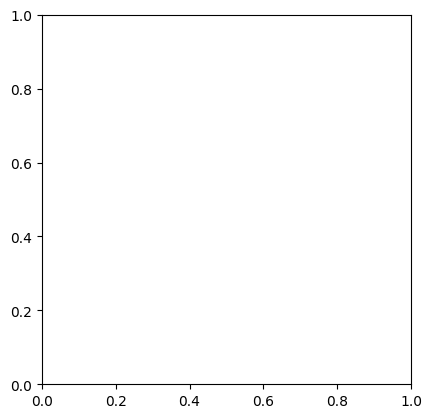

In [82]:
x = torch.Tensor(input_layer_1)
count = 0
for layer in model.children():
  if isinstance(layer, nn.Linear):
    # apply the linear model on the input, i.e. y = W @ X + b
    y = layer.weight @ x # is this correct?? (224, 55) @ (55, 1) I think so
    y = y + layer.bias
  else:
    # apply the non linear transformation, i.e. the RELU
    x = layer(y) # apply the ReLU on the y of the linear output and that becomes the new x
  count += 1
  if count == 2: break

x.shape
display_active_neurons(y)

In [75]:
second_layer = model[2]
print_weights(second_layer.weight)

row 0 tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0.

In [68]:
second_layer.bias

Parameter containing:
tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         1.,  1.,  1.,  1.,  1.,  1.,  1.,

In [29]:
first_layer = model[0]

# extract weights and biases
weights = first_layer.weight.data # shape (224, 55)
biases = first_layer.bias.data    # shape (224,)

weights.shape




# print(f"Neuron 0 weights: {weights[0]}")
# print(f"Neuron 0 bias {biases[0]}")

# # check neuron 105 (which outputs "-1.0")
# print(f"Neuron 105 weights: {weights[105]}")
# print(f"Neuron 105 bias: {biases[105]}")


for row in weights:
  #print(f"{row}")
  print(row)

tensor([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.])
tensor([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.])
tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.])
tensor([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
 

In [22]:
biases.shape

torch.Size([224])

In [23]:
biases

tensor([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
         0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 1

In [24]:
weights

tensor([[1., 0., 0.,  ..., 0., 0., 0.],
        [0., 1., 0.,  ..., 0., 0., 0.],
        [0., 0., 1.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [ ]:
#print(f"weights: {weights}")
print(f"weights shape: {weights.shape}")
for i, row in enumerate(weights):
  print(i, row, any(v != 0 for v in row))


In [ ]:
#add_safe_globals([Sequential])
#
#try:
#  model = torch.load(model_file_path, map_location="cpu", weights_only=False)
#  model.eval()
#  print("loaded succesfully!")
#except Exception as e:
#  print(f"Error: {e}")

In [12]:
last_linear_layer = model[-2] #  (5440): Linear(in_features=48, out_features=1, bias=True)
last_layer = model[-1]

# linear equation is = X @ W.T + b
# so if W is (1, 48) the input needs to be 48, 1 which cannot be??? or can it???
# then we have b which is 



print(f"shape {last_linear_layer.weight.shape}") # ok it says (1, 48) but that's basically (48, 1) so it receives 48 inputs
print(f"weights = {last_linear_layer.weight}")
print(f"biases shape {last_linear_layer.bias.shape}") # is says (1,) but I think it's 
print(f"biases = {last_linear_layer.bias}") # bias is -15.0; so after matrix multiplication of the input with the weights, this amount is subtracted


print(f"last_layer {last_layer}, i.e. RELU")


shape torch.Size([1, 48])
weights = Parameter containing:
tensor([[ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
          1.,  1., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
         -2., -2., -2., -2.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
          1.,  1.,  1.,  1.,  1.,  1.]], requires_grad=True)
biases shape torch.Size([1])
biases = Parameter containing:
tensor([-15.], requires_grad=True)
last_layer ReLU(), i.e. RELU


In [27]:
last_linear_layer.weight

Parameter containing:
tensor([[ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
          1.,  1., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
         -2., -2., -2., -2.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,
          1.,  1.,  1.,  1.,  1.,  1.]], requires_grad=True)

In [26]:
last_linear_layer.bias

Parameter containing:
tensor([-15.], requires_grad=True)

In [ ]:
!pip install torchsummary

In [ ]:
!pip install numpy

In [11]:
# use torchsummary to visualize layer by layer output shapes
from torchsummary import summary
input_shape = (1, 55)
summary(model, input_size=input_shape) # skip batch dimension -> what is this????

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                       [-1]          12,544
              ReLU-2                       [-1]               0
            Linear-3                       [-1]          52,200
              ReLU-4                       [-1]               0
            Linear-5                       [-1]          14,912
              ReLU-6                       [-1]               0
            Linear-7                       [-1]          13,520
              ReLU-8                       [-1]               0
            Linear-9                       [-1]          41,800
             ReLU-10                       [-1]               0
           Linear-11                       [-1]          42,612
             ReLU-12                       [-1]               0
           Linear-13                       [-1]          43,452
             ReLU-14                   

In [ ]:
!pip install onnx

In [ ]:
# export the model to onnx and visualize it with Netron.app
dummy_input = [0] * 55 # what do I put here?? it's the input to the first layer, so you need to look into the first layer characteristics
torch.onnx.export(model, dummy_input, "model.onnx")

In [76]:
!pip install matplotlib

  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 19.7 MB/s eta 0:00:0031m20.6 MB/s eta 0:00:01
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 19.3 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [77]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
neuron_matrix = np.array([
  [0.2, 0.8, 0.1, 0.9],
  [0.5, 0.3, 0.7, 0.5],
  [0.0, 0.6, 0.9, 0.2]
])


def display_active_neurons(neuron_matrix):
  threshold = 0.0
  # classify neurons as active or inactive
  active_neurons = neuron_matrix > threshold


  # crate a heatmap
  plt.imshow(active_neurons, cmap='RdBu', interpolation='nearest') # RdBu
  plt.colorbar(label="Activity")
  plt.title("Active Neurons")
  plt.show()

display_active_neurons(neuron_matrix)